## Setup

Import the basic libraries.

In [1]:
import numpy as np
import torch
import matplotlib as mpl
import matplotlib.pyplot as plt
from IPython import display
import os
%matplotlib inline

Initialize the environment for running the experiment.

In [2]:
# Paths for loading/storing results.
name = 'results/Gaussian_MINEE' # filename
chkpt_name = name+'.pt'              # checkpoint
fig_name = name+'.pdf'               # output figure

# use GPU if available
if torch.cuda.is_available(): 
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
else:
    torch.set_default_tensor_type(torch.FloatTensor)

# initialize random seed
np.random.seed(0)
torch.manual_seed(0);

## Data

Generate data using the gaussian model.

In [3]:
from data.gaussian import Gaussian

In [4]:
sample_size = 1000   # sample size
rho = 0.9           # model parameter

rep = 1             # number of repeated runs
d = 6               # number of dimensions for X (and Y)

X = np.zeros((rep,sample_size,d))
Y = np.zeros((rep,sample_size,d))
g = Gaussian(sample_size=sample_size,rho=rho)
for i in range(rep):
    for j in range(d):
        data = g.data
        X[i,:,j] = data[:,0]
        Y[i,:,j] = data[:,1]

A plot of the first dimension of $Y$ against that of $X$.

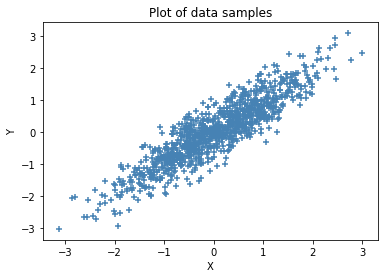

In [5]:
plt.scatter(X[0,:,0],Y[0,:,0],label="data",marker="+",color="steelblue")
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Plot of data samples')
plt.show()

## Model

Initialize the MINEE model.

In [6]:
from model.minee import MINEE 

In [7]:
batch_size = 100        # batch size of data sample
ref_batch_factor = 10  # batch size expansion factor for reference sample
lr = 1e-4               # learning rate

minee_list = []
for i in range(rep):
    minee_list.append(MINEE(torch.Tensor(X[i]),torch.Tensor(Y[i]),
                            batch_size=batch_size,ref_batch_factor=ref_batch_factor,lr=lr))
dXY_list = np.zeros((rep,0))
dX_list = np.zeros((rep,0))
dY_list = np.zeros((rep,0))

Load previous results.

In [8]:
load_available = True # set to False to prevent loading previous results
if load_available and os.path.exists(chkpt_name):
    checkpoint = torch.load(
        chkpt_name, map_location='cuda' if torch.cuda.is_available() else 'cpu')
    dXY_list = checkpoint['dXY_list']
    dX_list = checkpoint['dX_list']
    dY_list = checkpoint['dY_list']
    minee_state_list = checkpoint['minee_state_list']
    for i in range(rep):
        minee_list[i].load_state_dict(minee_state_list[i])
    print('Previous results loaded.')

Previous results loaded.


Continuously train the model. The following can be executed repeatedly and after loading previous results.

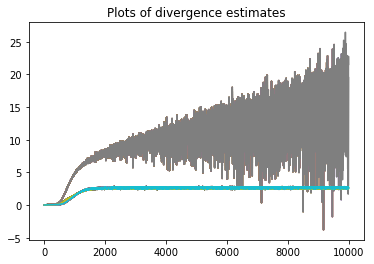

In [8]:
continue_train = True  # set to True to continue to train
num_big_steps = 50     # number of small steps
num_small_steps = 200  # number of big steps
if continue_train:
    for k in range(num_big_steps):
        for j in range(num_small_steps):
            dXY_list = np.append(dXY_list, np.zeros((rep, 1)), axis=1)
            dX_list = np.append(dX_list, np.zeros((rep, 1)), axis=1)
            dY_list = np.append(dY_list, np.zeros((rep, 1)), axis=1)
            for i in range(rep):
                minee_list[i].step()
                dXY_list[i, -1], dX_list[i, -1], dY_list[i, -1] = minee_list[i].forward()
        # To show intermediate works
        for i in range(rep):
            plt.plot(dXY_list[i, :],label='dXY')
            plt.plot(dX_list[i, :],label='dX')
            plt.plot(dY_list[i, :],label='dY')
            plt.title('Plots of divergence estimates')
        display.clear_output(wait=True)
        display.display(plt.gcf())
    display.clear_output()

Save current results.

In [12]:
overwrite = True  # set to True to overwrite previously stored results
if overwrite or not os.path.exists(chkpt_name):
    minee_state_list = [minee_list[i].state_dict() for i in range(rep)]
    torch.save({
        'dXY_list': dXY_list,
        'dX_list': dX_list,
        'dY_list': dY_list,
        'minee_state_list': minee_state_list
    }, chkpt_name)
    print('Current esults saved.')

Current esults saved.


## Analysis

Calculate the ground truth mutual information.

In [9]:
mi = g.ground_truth * d
print('Ground truth is {} nats.'.format(mi))

Ground truth is 4.982193620464953 nats.


Apply moving average to smooth out the mutual information estimate.

In [10]:
mi_ma_rate = 0.01            # rate of moving average
mi_list = (dXY_list-dX_list-dY_list).copy()    # see also the estimate() member function of MINE
for i in range(1,dXY_list.shape[1]):
    mi_list[:,i] = (1-mi_ma_rate) * mi_list[:,i-1] + mi_ma_rate * mi_list[:,i]

Plot the mutual information estimate after different number of iterations. The red dashed line shows the ground truth, and the green dotted line is the number of iterations where 90% of the ground truth is reached.

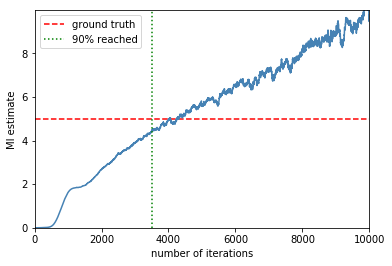

In [11]:
plt.axhline(mi,label='ground truth',linestyle='--',color='red')
for i in range(rep):
    plt.plot(mi_list[i,:],color='steelblue')
    for t in range(mi_list[i].shape[0]):
        if (mi_list[0,t]>.9*mi):
            plt.axvline(t,label='90% reached',linestyle=':',color='green')
            break
plt.xlim((0,mi_list[0].shape[0]))
plt.ylim((0,mi*2))
plt.xlabel("number of iterations")
plt.ylabel("MI estimate")
plt.legend()
plt.savefig(fig_name)